In [2]:
import scipy
import matplotlib.pyplot as plt
import mne
from omegaconf import OmegaConf
import pywt
import numpy as np
import pyeeg as pe
import pandas as pd

from plotly import tools
import chart_studio.plotly as py
from plotly.graph_objs import Layout, Scatter, Figure, Marker, Annotations
from plotly.graph_objs.layout import YAxis, Font, Annotation
import plotly.offline as pyo
from autoreject import get_rejection_threshold

pyo.init_notebook_mode()

General info about dataset 1

In [11]:
pe.spectrum.bin_power(dataset1.get_data()[0], [0.5,4,7,12,30], 256)[0]

array([30.70712598,  6.80880336,  7.04730917, 16.74192982])

### DWT

In [129]:
# Create wavelet object and define parameters
w = pywt.Wavelet('db8')
data = dataset1.get_data()
data_wt = np.zeros(data.shape)

#for i in range(data.shape[0]):
for i in range(data.shape[0]):
    maxlev = pywt.dwt_max_level(len(data[i]), w.dec_len)
    # maxlev = 2 # Override if desired
    print("maximum level is " + str(maxlev))
    threshold = 0.04 # Threshold for filtering

    # Decompose into wavelet components, to the level selected:
    coeffs = pywt.wavedec(data[i], 'db8', level=maxlev)
    #cA = pywt.threshold(cA, threshold*max(cA))

    for j in range(1, len(coeffs)):
        coeffs[j] = pywt.threshold(coeffs[j], threshold*max(coeffs[j]))
    

    datarec = pywt.waverec(coeffs, 'db8')
    data_wt[i,:] = datarec[:]


maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12
maximum level is 12


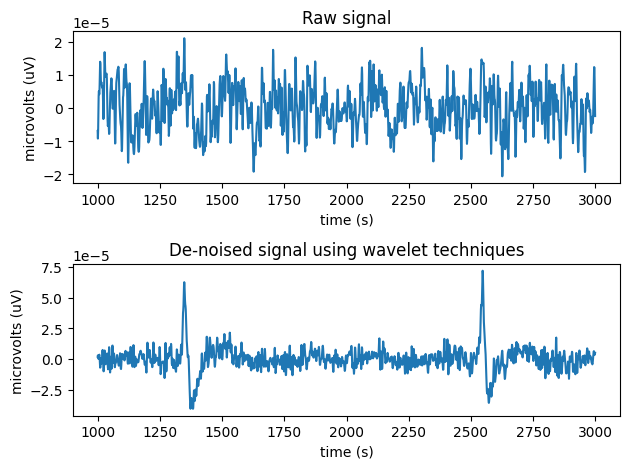

In [110]:
mintime = 1000
maxtime = mintime + 2000
index = [j for j in range(150000)]
plt.figure()
plt.subplot(2, 1, 1)
plt.plot(index[mintime:maxtime], data[i][mintime:maxtime])
plt.xlabel('time (s)')
plt.ylabel('microvolts (uV)')
plt.title("Raw signal")
plt.subplot(2, 1, 2)
plt.plot(index[mintime:maxtime], datarec[mintime:maxtime])
plt.xlabel('time (s)')
plt.ylabel('microvolts (uV)')
plt.title("De-noised signal using wavelet techniques")

plt.tight_layout()
plt.show()

In [131]:
data_wt_mne = mne.io.RawArray(data_wt, dataset1.info)

Creating RawArray with float64 data, n_channels=22, n_times=89856
    Range : 0 ... 89855 =      0.000 ...   350.996 secs
Ready.


# Dataset 1

In [80]:
config = OmegaConf.load('../config/config.yaml')

df = pd.DataFrame(columns=config['ch_names'].append(['subject', 'class']))
df

""


In [88]:
def rename_channels(data):
    """
    rename channels to remove 'EEG', '-A1' and '-A2'
    """
    ch_names_dict = {}
    for i in range(31):
        ch_name = data.info['chs'][i]['ch_name']
        ch_name_new = ch_name
        ch_name_new = ch_name_new.replace('EEG ', '')
        ch_name_new = ch_name_new.replace('-A1', '')
        ch_name_new = ch_name_new.replace('-A2', '')
        ch_names_dict[ch_name] = ch_name_new
    
    mne.rename_channels(data.info, ch_names_dict)
    return data

In [91]:
all_files = glob.glob('../data/raw/Dataset_1/All Participants//**/*.edf', recursive=True)
mne.set_log_level(False)
for files in all_files:
    raw = mne.io.read_raw_edf(files, preload=True);
    raw = rename_channels(raw)
    if raw.info['ch_names'][:-1]==config['ch_names1']:
        print(True)
    else:
        print(raw.info['ch_names'][:-1])

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
['F7', 'FT7', 'T3', 'TP7', 'T5', 'Fp1', 'F3', 'FC3', 'C3', 'CP3', 'P3', 'O1', 'Fpz', 'Fz', 'FCz', 'Cz', 'CPz', 'Pz', 'Oz', 'Fp2', 'F4', 'FC4', 'C4', 'CP4', 'P4', 'O2', 'F8', 'FT8', 'T4', 'TP8', 'T6']
['Fp1', 'Fpz', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FT7', 'FC3', 'FCz', 'FC4', 'FT8', 'T3', 'C3', 'Cz', 'C4', 'T4', 'TP7', 'CP3', 'CPz', 'CP4', 'TP8', 'T5', 'P5', 'P3', 'Pz', 'P4', 'P6', 'T6', 'Po7', 'EEG Po3', 'EEG Poz', 'EEG Po4', 'EEG Po8', 'EEG O1', 'EEG Oz', 'EEG O2']
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4', 'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2', 'Fpz', 'Oz', 'FT7', 'FC3', 'FCz', 'FC4', 'FT8', 'TP7', 'CP3', 'CPz', 'CP4', 'TP8', 'EEG P5', 'EEG 

Extracting EDF parameters from d:\Downloads\DTU\semester 4\thesis\MSc-Thesis\data\raw\Dataset_1\All Participants\S14_\S14-Pre_assessment\S14-pre-EO1_pre_EEG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 64999  =      0.000 ...   129.998 secs...
Using matplotlib as 2D backend.


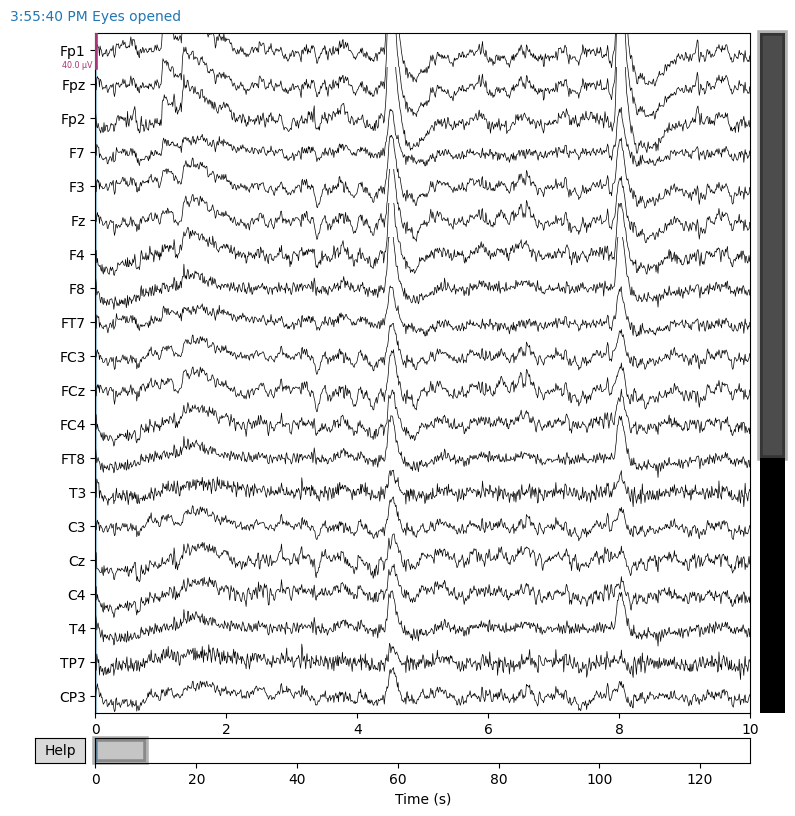

In [3]:
from calendar import c


raw = mne.io.read_raw_edf(r'..\data\raw\Dataset_1\All Participants\S14_\S14-Pre_assessment\S14-pre-EO1_pre_EEG.edf', preload=True)

ch_names_dict = {}
for i in range(31):
    ch_name = raw.info['chs'][i]['ch_name']
    ch_name_new = ch_name
    ch_name_new = ch_name_new.replace('EEG ', '')
    ch_name_new = ch_name_new.replace('-A1', '')
    ch_name_new = ch_name_new.replace('-A2', '')
    ch_names_dict[ch_name] = ch_name_new

    
mne.rename_channels(raw.info, ch_names_dict)

def read_montage(show=False):
    layout = pd.read_csv(r'..\data\raw\Dataset_1\Standard-10-10-Cap31-eeg.txt', sep = '\t')
    layout.columns = layout.columns.str.strip()
    layout["labels"] = layout["labels"].str.strip()
    layout = layout.set_index('labels')
    layout = layout.to_dict(orient = "index")
    for channel in layout.keys():
        yxz = np.array([layout[channel]["Y"]/15, layout[channel]["X"]/15, layout[channel]["Z"]/15])
        layout[channel] = yxz
    layout = mne.channels.make_dig_montage(layout, coord_frame='head')
    if show:
        mne.viz.plot_montage(layout);
    
    return layout

layout = read_montage()
raw.set_montage(layout, on_missing = 'ignore');

raw.plot();

In [9]:
# Filter settings
ica_low_cut = 0.5       # For ICA, we filter out more low-frequency power
hi_cut  = 30

raw_ica = raw.copy().filter(ica_low_cut, hi_cut);

# Break raw data into 1 s epochs
tstep = 1.0
events_ica = mne.make_fixed_length_events(raw_ica, duration=tstep);
epochs_ica = mne.Epochs(raw_ica, events_ica,
                        tmin=0.0, tmax=tstep,
                        baseline=None,
                        preload=True);

reject = get_rejection_threshold(epochs_ica);

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 sec)

Not setting metadata
130 matching events found
No baseline correction applied


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.1s finished


0 projection items activated
Using data from preloaded Raw for 130 events and 501 original time points ...
1 bad epochs dropped
Estimating rejection dictionary for eeg


In [10]:
# ICA parameters
random_state = 42   # ensures ICA is reproducable each time it's run
ica_n_components = .999     # Specify n_components as a decimal to set % explained variance

# Fit ICA
ica = mne.preprocessing.ICA(n_components=ica_n_components,
                            random_state=random_state,
                            )
ica.fit(epochs_ica,
        reject=reject,
        tstep=tstep)

Fitting ICA to data using 32 channels (please be patient, this may take a while)


C:\Users\bekar\AppData\Local\Temp\ipykernel_10380\2653253328.py:9: RuntimeWarning:

The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject



Selecting by explained variance: 22 components
Fitting ICA took 8.1s.


Method,fastica
Fit,69 iterations on epochs (64629 samples)
ICA components,22
Explained variance,99.9 %
Available PCA components,32
Channel types,eeg
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=22, n_times=65000
    Range : 0 ... 64999 =      0.000 ...   129.998 secs
Ready.


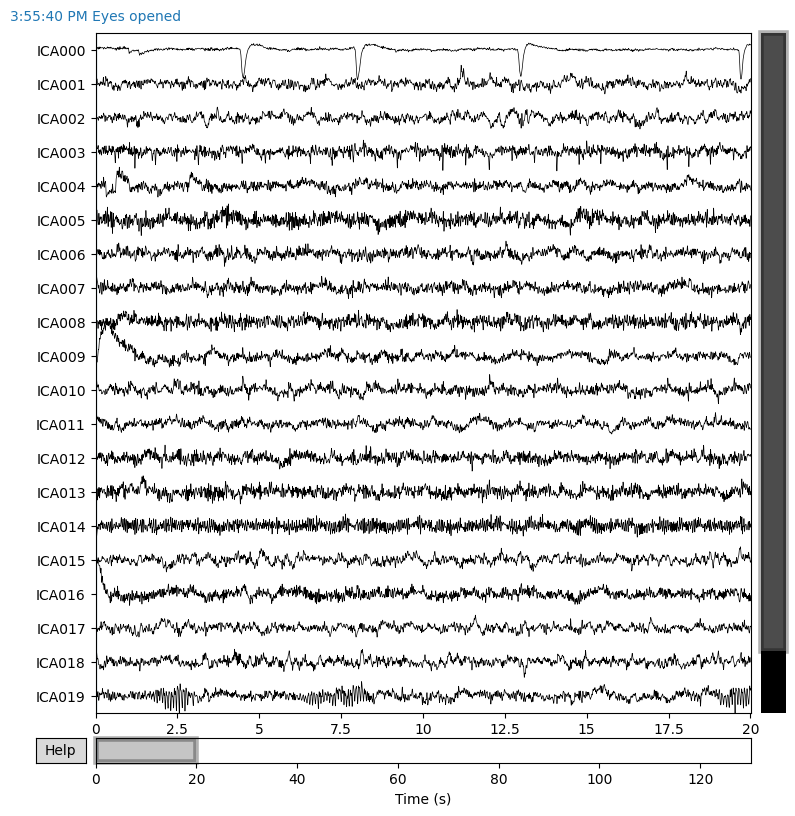

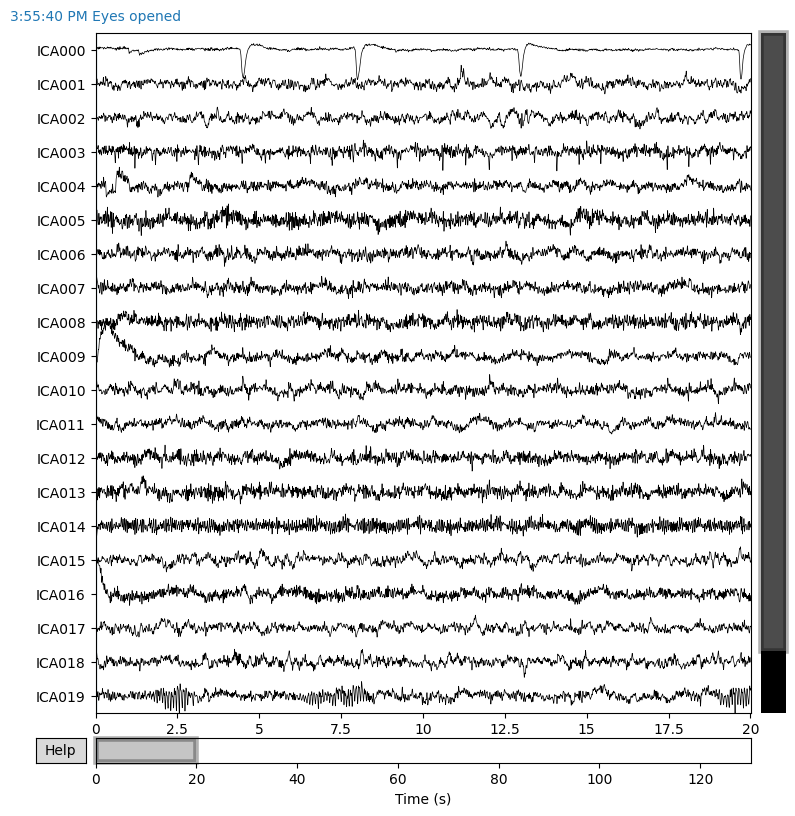

In [11]:
ica.plot_sources(inst=raw_ica);

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
129 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
129 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
129 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
129 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
129 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
129 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
129 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
129 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
129 matching events found
No baseline correction applied
0 pro

d:\Downloads\DTU\semester 4\thesis\thesis_venv\lib\site-packages\mne\viz\ica.py:128: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



129 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
129 matching events found
No baseline correction applied
0 projection items activated


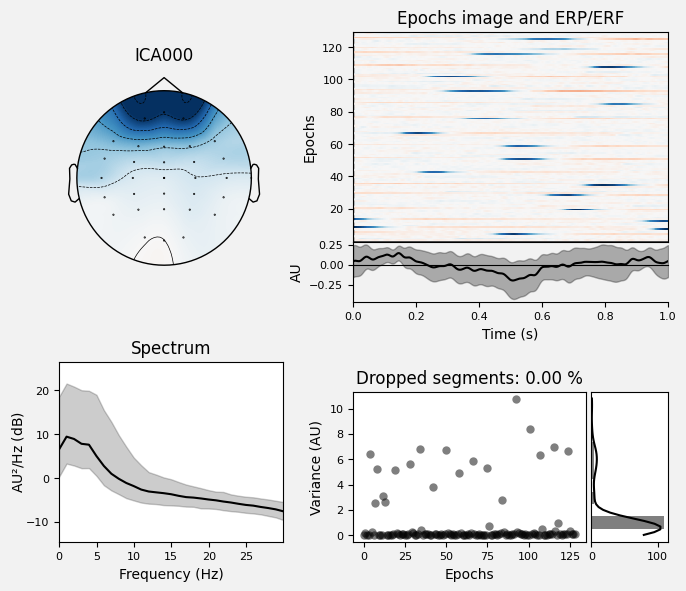

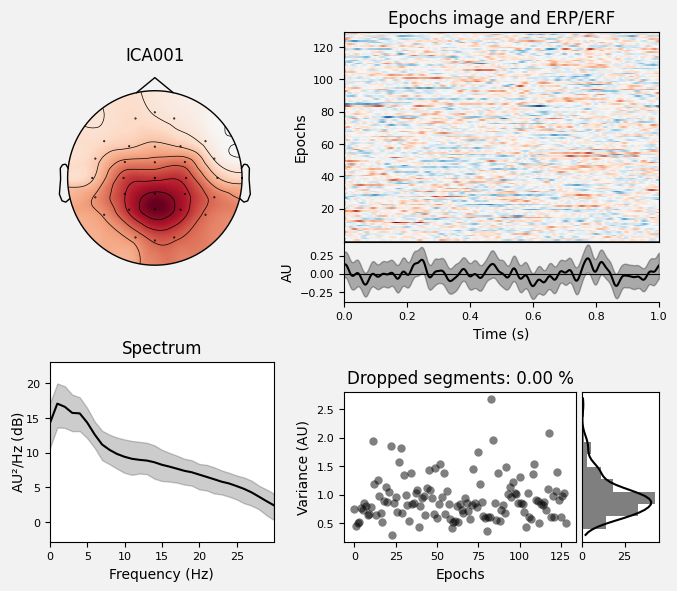

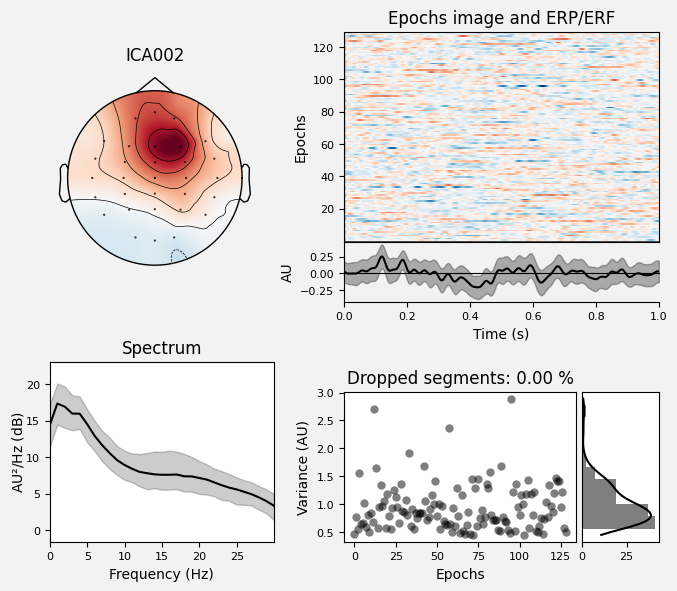

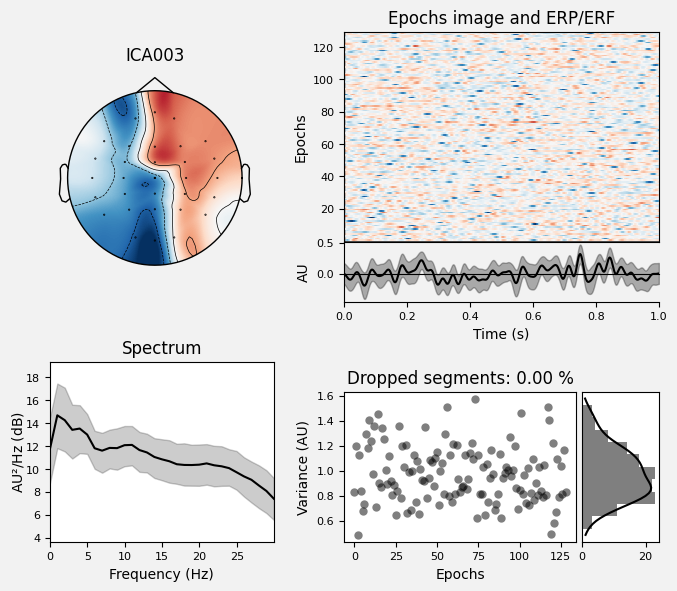

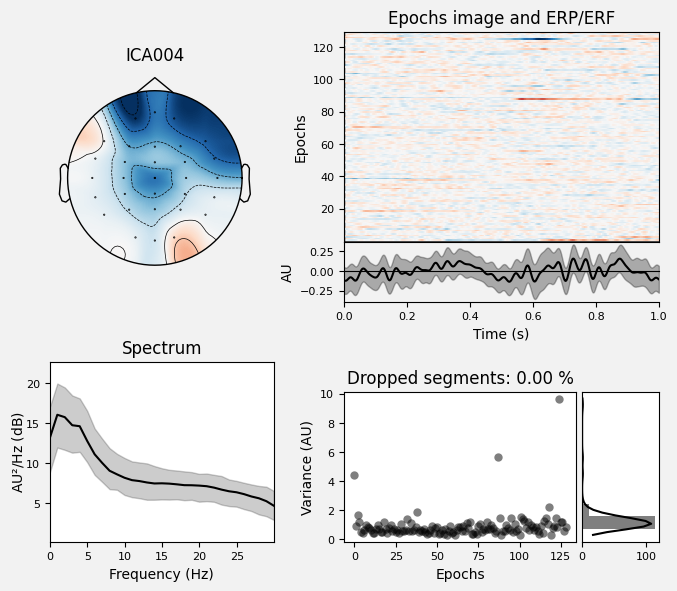

...

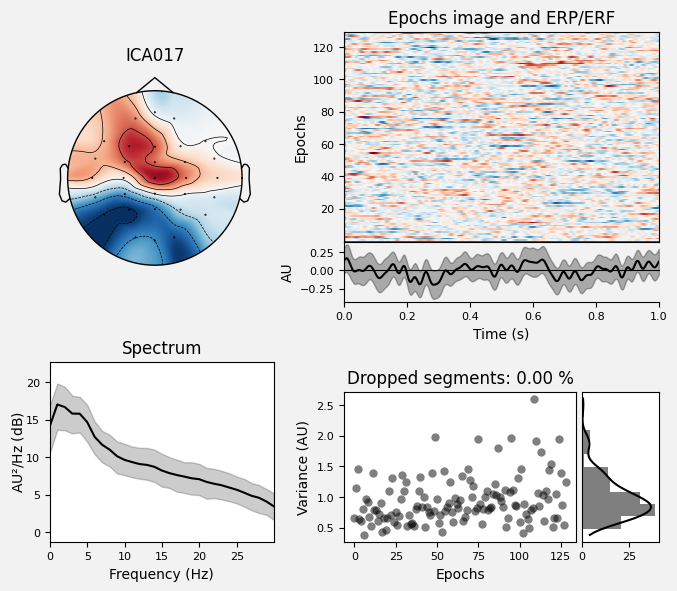

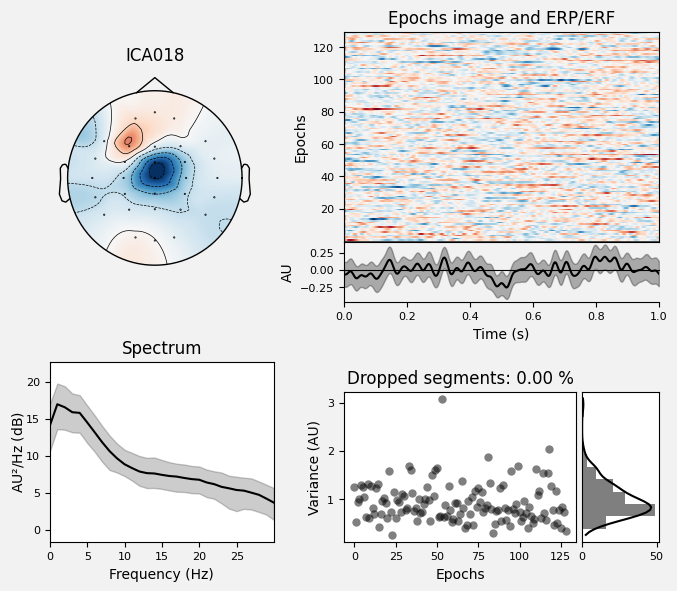

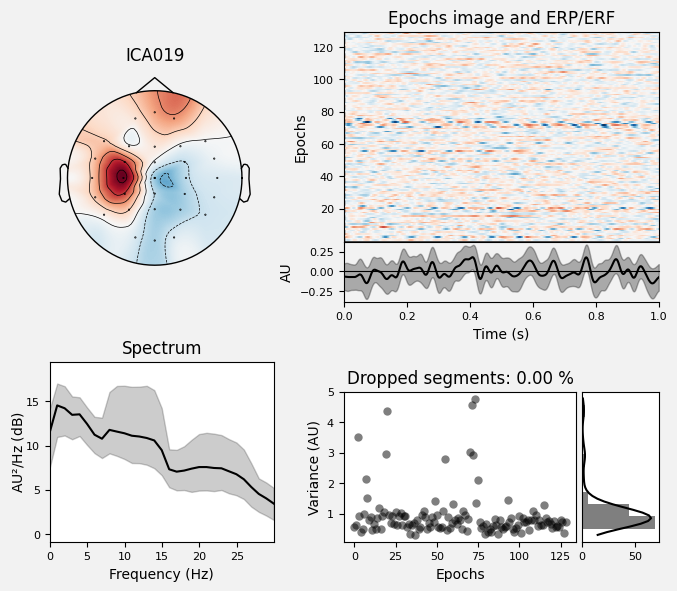

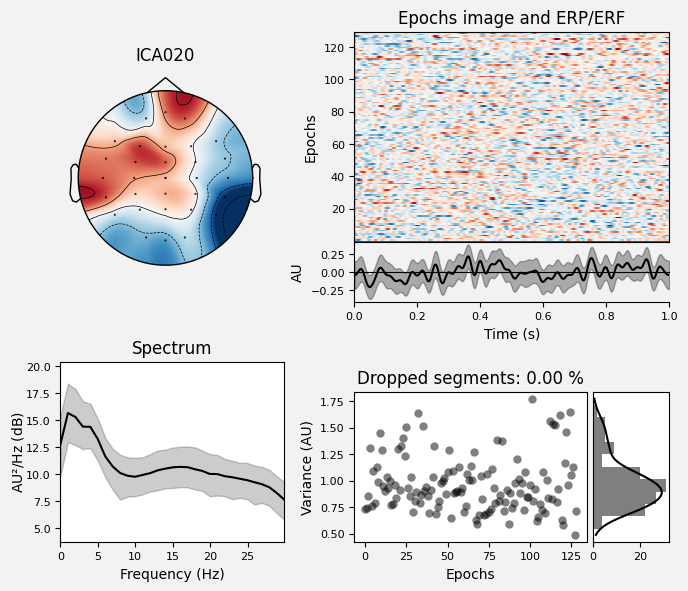

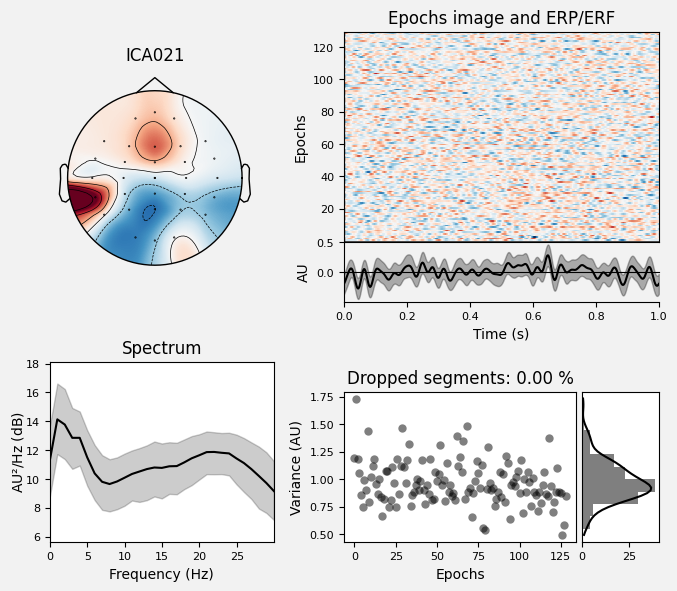

In [12]:
ica.plot_properties(epochs_ica, picks=range(0, ica.n_components_), psd_args={'fmax': hi_cut});

In [18]:
ica.exclude = [0, 14]
ica.apply(raw_ica)

Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 2 ICA components
    Projecting back using 32 PCA components


<RawEDF | S14-pre-EO1_pre_EEG.edf, 32 x 65000 (130.0 s), ~15.9 MB, data loaded>

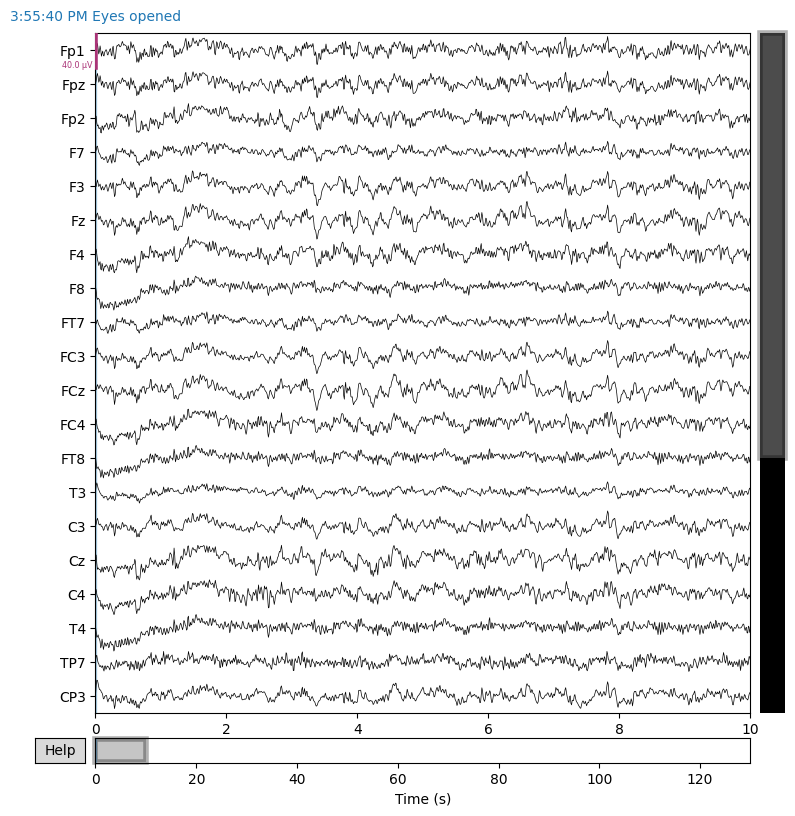

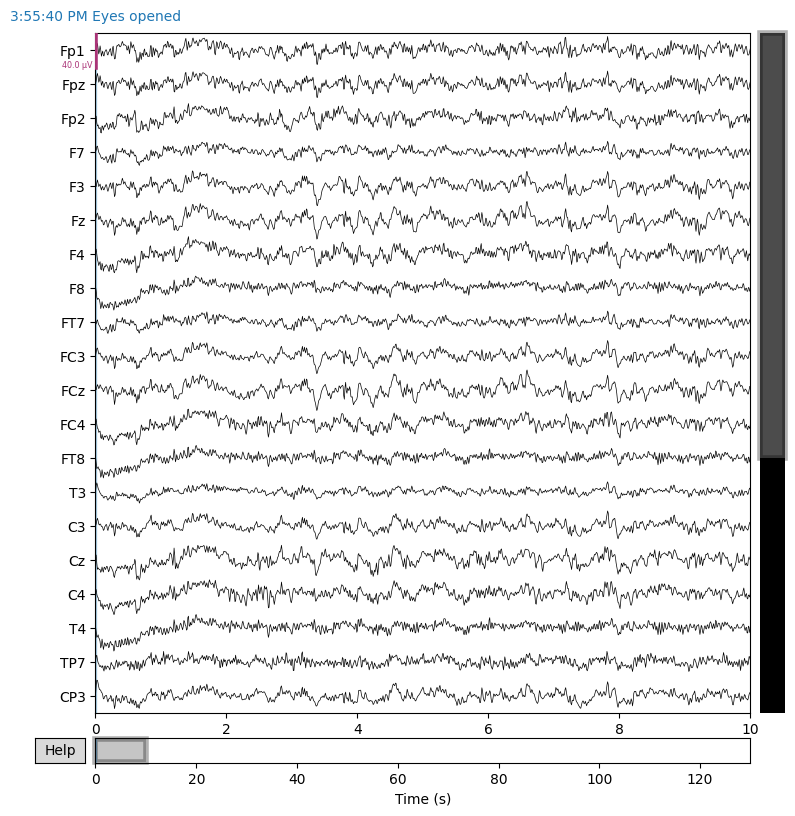

In [19]:
raw_ica.plot()

Using EOG channels: EEG Fp1-A1, EEG F8-A2
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff fr

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  22 out of  22 | elapsed:    0.0s finished


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 5000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  22 out of  22 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


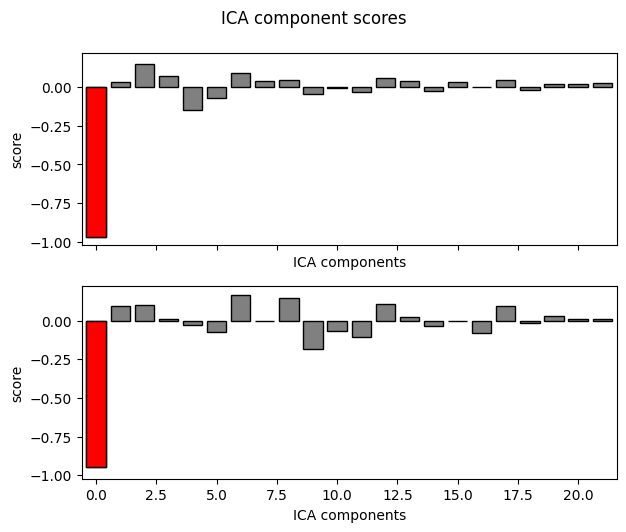

In [170]:
ica_z_thresh = 1.96 
eog_indices, eog_scores = ica.find_bads_eog(raw_ica, 
                                            ch_name=['EEG Fp1-A1', 'EEG F8-A2'], 
                                            threshold=ica_z_thresh)
ica.exclude = eog_indices

ica.plot_scores(eog_scores);

sklearn ICA

In [120]:
from sklearn.decomposition import FastICA

def bandpass_filter(data):
    low_cut = 0.5
    high_cut  = 32

    data_filt = data.copy().filter(low_cut, high_cut)

    return data_filt

raw_filtered = bandpass_filter(raw)

# compute ICA to identify artifacts
ICA = FastICA(random_state=0, tol=0.001, max_iter=2000)
ICA_sources = ICA.fit_transform(raw_filtered.get_data().T)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.0s finished
d:\Downloads\DTU\semester 4\thesis\thesis_venv\lib\site-packages\sklearn\decomposition\_fastica.py:494: FutureWarning:

Starting in v1.3, whiten='unit-variance' will be used by default.



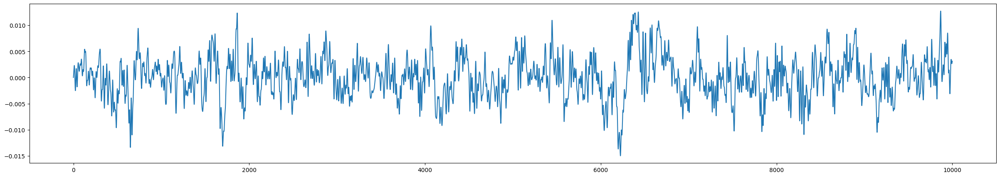

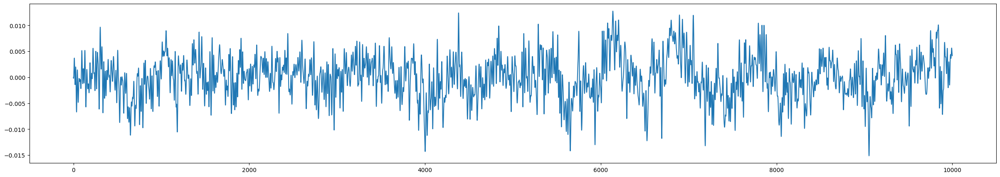

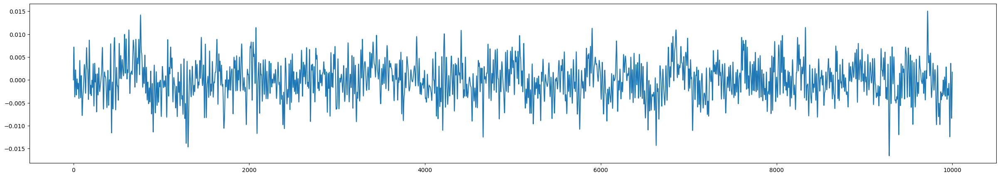

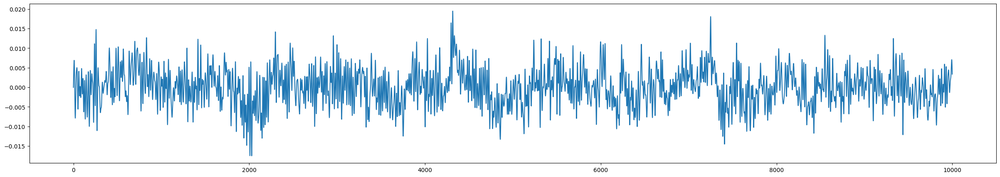

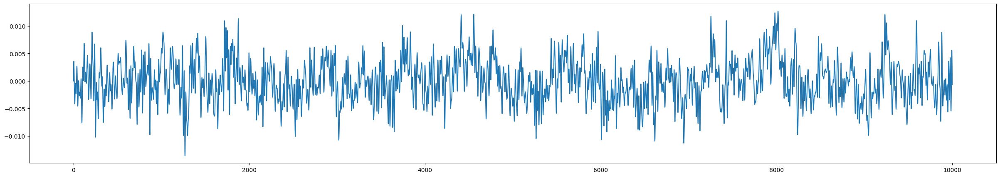

...

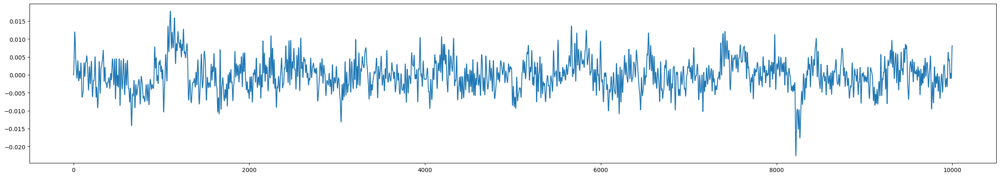

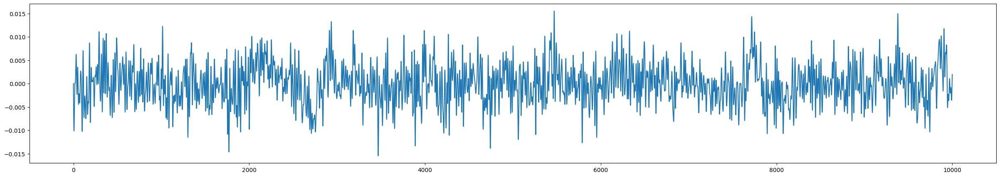

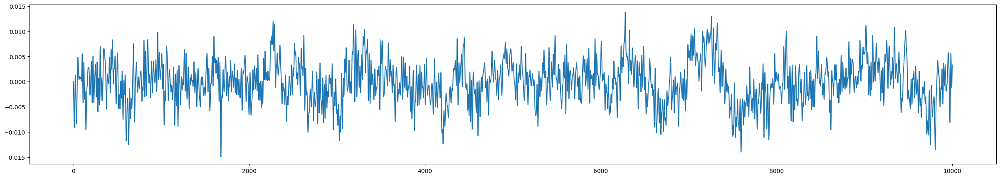

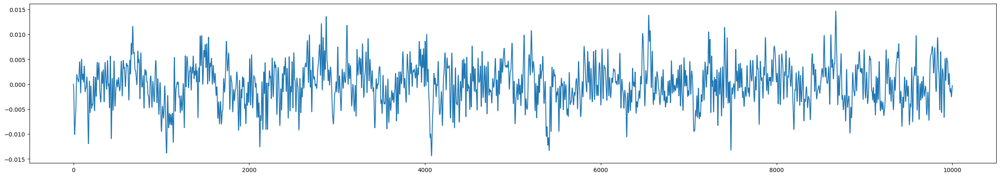

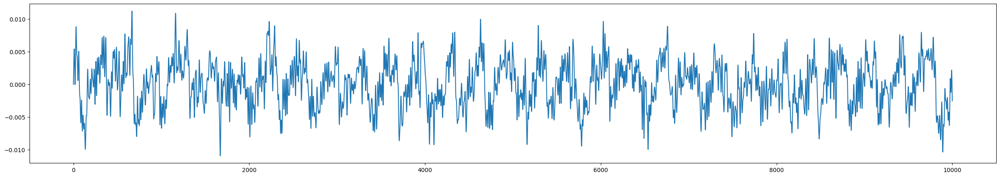

In [121]:
for i in range(ICA_sources.shape[1]):
    plt.figure(figsize=(30,5))
    plt.plot(ICA_sources[:10000,i])
    plt.show()